In [1]:
!python --version #Python 3.6.8

Python 3.6.8


Вообще говоря, возможно, что все будет работать без проблем и на новых версиях tensorflow. Единственное, что может сломаться это импортирование оптимизатора Adam или SGD

In [2]:
import tensorflow
tensorflow.__version__ # '1.15.8'

'1.15.8'

In [3]:
# на старой версии
tensorflow.test.is_gpu_available() # True
# на более новой версии должно работать это
# tensorflow.config.list_physical_devices('GPU')

True

#### Установка tensorflow-directml и других библиотек

In [6]:
# удалить tensorflow, если он уже установлен. tensorflow и tensorflow-directml
# конфликтуют из-за версий numpy
!pip uninstall tensorflow

In [4]:
# перед установкой tensorflow-directml необходимо сначала установить numpy
!pip install numpy

In [ ]:
!pip install tensorflow-directml

In [ ]:
# другие библиотеки, использующиеся в программе
!pip install pydicom
!pip install matplotlib
!pip install scipy
!pip install opencv-python
!pip install imageio

#### Подготовка Train Data

In [4]:
# Unet3D - полезная функциональность, вынесенная в отдельный файл для удобства
from Unet3D import *
import numpy as np
from glob import glob
import matplotlib.pyplot as plt
#import napari # не работает (needs python >= 3.7)
import imageio # работает (needs Python >= 3.7)
from IPython import display # для гифок

In [5]:
# формирование адресов к файлам
# patients = (patient, paths_to_dicom_files)
patients_id = [1, 2, 5, 6, 8, 10, 14, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]
patients = []
for i in patients_id:
    patients.append(glob("./data_storage/CT_data_batch1/{}/DICOM_anon/*.dcm".format(i)))
patients = np.array(patients)
patients.shape # (20,)

(20,)

In [6]:
# Варианты 1, 2
# !!! Отрежет по минимуму количество файлов
cut_min = min([np.array(patients[i]).size for i in range(patients.size)])
for i in range(patients.size):
    patients[i] = np.array(patients[i][:cut_min])
patients = np.array(patients)
patients.shape # (20,)

(20,)

In [3]:
# Считывание dicom файлов
patients_images = load_scans(patients)
len(patients_images), len(patients_images[0]) # (20, 96)
# patients_images = np.array(patients_images) не делать. numpy создает массив из информации о пациенте, содержащейся в каждом файле dicom

(20, 96)

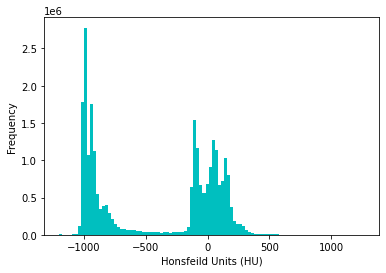

In [4]:
# преобразование dicom файлов в pixel_data согласно шкале HU
patients_images_hu = get_pixels_hu(patients_images)
hu_hist(patients_images_hu[0])

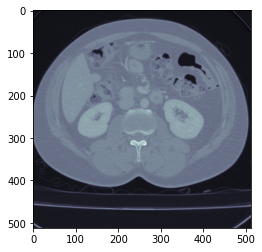

In [9]:
# пример, как посмотреть на конкретное изображение
plt.imshow(patients_images_hu[0][0], cmap=plt.cm.bone)

##### Вариант 1: Не кубик, подгонка под 0-го пациента

In [81]:
# Интерполяция под одного пациента
patients_images_resampled = []
# patients_images_hu = np.array(patients_images_hu)
print(f'Shape before resampling:{show_shape(patients_images_hu)}')
for images in patients_images_hu:
    print("processing patient")
    images_resampled, spacing = resample(images, pydicom.read_file(patients[0][0]), [1,1,1])
    patients_images_resampled.append(images_resampled)
patients_images_resampled = np.array(patients_images_resampled).copy()
print(f'Shape after resampling:{show_shape(patients_images_resampled)}')
# Shape before resampling:(20, 81, 512, 512)
# processing patient ...
# Shape after resampling:(20, 243, 352, 352)

Shape before resampling:(20, 81, 512, 512)
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
Shape after resampling:(20, 243, 352, 352)


In [82]:
# Изменение размеров изображений
print(f'Shape before resizing:{show_shape(patients_images_resampled)}')
patients_images_resized = []
for images in patients_images_resampled:
    images_resized = resize(images, 128)
    patients_images_resized.append(images_resized)
patients_images_resized = np.array(patients_images_resized).copy()
print(f'Shape after resizing:{show_shape(patients_images_resized)}')
# Shape before resizing:(20, 243, 352, 352)
# Shape after resizing:(20, 243, 128, 128)

Shape before resizing:(20, 243, 352, 352)
Shape after resizing:(20, 243, 128, 128)


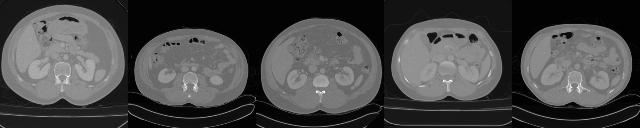

In [83]:
# create_images_gifs(patients_id, patients_images_resized, path_to_save="train_resampled_resized.gif")
display.Image(f"train_resampled_resized.gif", format="png")

##### Вариант 2,3 : Нормальное преобразование каждого пациента в кубик 128, 128, 128

In [7]:
# create_images_gifs(patients_id[:5], patients_images_hu[:5], path_to_save="report.gif")
display.Image(f"report.gif", format="png")

In [12]:
# Процесс интерполяции
patients_images_resampled = []
target_scale = np.array([128, 128, 128])

# patients_images_hu = np.array(patients_images_hu)
print(f'Shape before resampling:{show_shape(patients_images_hu)}')

for images in patients_images_hu:
    images_resampled = resize_data_volume(images,  target_scale)
    patients_images_resampled.append(images_resampled)
patients_images_resampled = np.array(patients_images_resampled).copy()
print(f'Shape after resampling:{show_shape(patients_images_resampled)}')
# Shape before resampling:(20, 96, 512, 512)
# resize factor is
# Shape after resampling:(20, 128, 128, 128)

Shape before resampling:(20, 96, 512, 512)
resize factor is [1.33333333 0.25       0.25      ]
resize factor is [1.58024691 0.25       0.25      ]
resize factor is [1.34736842 0.25       0.25      ]
resize factor is [1.45454545 0.25       0.25      ]
resize factor is [1.04065041 0.25       0.25      ]
resize factor is [1.16363636 0.25       0.25      ]
resize factor is [1.34736842 0.25       0.25      ]
resize factor is [1.40659341 0.25       0.25      ]
resize factor is [1.15315315 0.25       0.25      ]
resize factor is [1.42222222 0.25       0.25      ]
resize factor is [0.49805447 0.25       0.25      ]
resize factor is [1.26732673 0.25       0.25      ]
resize factor is [0.53333333 0.25       0.25      ]
resize factor is [1.04065041 0.25       0.25      ]
resize factor is [0.54468085 0.25       0.25      ]
resize factor is [1.12280702 0.25       0.25      ]
resize factor is [0.52892562 0.25       0.25      ]
resize factor is [1.25490196 0.25       0.25      ]
resize factor is [0.5

In [ ]:
create_images_gifs(patients_id[:5], patients_images_resampled[:5], path_to_save="report.gif")
display.Image(f"report.gif", format="png")

In [ ]:
# create_images_gifs(patients_id, patients_images_resampled, path_to_save="train_cubic.gif")
display.Image(f"train_cubic.gif", format="png")

##### Вариант 4: "Умный кубик"

In [11]:
# Умная интерполяция для подгона под размер вокселя [1, 1, 1]
patients_images_resampled = []
# patients_images_hu = np.array(patients_images_hu)
for i, images in enumerate(patients_images_hu):
    print(f'Shape before resampling:{show_shape(patients_images_hu, index=i)}')
#     print("processing patient")
    images_resampled, spacing = resample_path(images, patients[i][0], [1,1,1])
    print(spacing)
    patients_images_resampled.append(images_resampled)
    print(f'Shape after resampling:{show_shape(patients_images_resampled, index=i)}')
patients_images_resampled = np.array(patients_images_resampled)

Shape before resampling:(20, 96, 512, 512)
[1.         1.00024873 1.00024873]
Shape after resampling:(1, 288, 352, 352)
Shape before resampling:(20, 81, 512, 512)
[1.0007722 1.        1.       ]
Shape after resampling:(2, 259, 398, 398)
Shape before resampling:(20, 95, 512, 512)
[1. 1. 1.]
Shape after resampling:(3, 304, 387, 387)
Shape before resampling:(20, 88, 512, 512)
[1.         0.99870597 0.99870597]
Shape after resampling:(4, 264, 333, 333)
Shape before resampling:(20, 123, 512, 512)
[0.99898477 1.         1.        ]
Shape after resampling:(5, 394, 376, 376)
Shape before resampling:(20, 110, 512, 512)
[1. 1. 1.]
Shape after resampling:(6, 352, 355, 355)
Shape before resampling:(20, 95, 512, 512)
[1. 1. 1.]
Shape after resampling:(7, 304, 291, 291)
Shape before resampling:(20, 91, 512, 512)
[1.00068729 1.         1.        ]
Shape after resampling:(8, 291, 405, 405)
Shape before resampling:(20, 111, 512, 512)
[1.00056338 1.         1.        ]
Shape after resampling:(9, 355, 35

In [12]:
# Избавляемся от крышки. Теперь по depth пациенты равны абсолютно
cut_min = min([len(patients_images_resampled[i]) for i in range(len(patients_images_resampled))])
patients_wise = []
for i in range(len(patients_images_resampled)):
    a = patients_images_resampled[i][:cut_min]
    patients_wise.append(a)
show_shape(patients_wise, index=i)

(20, 246, 375, 375)

In [13]:
# Интерполируем по глубине
patients_images_resampled = []
target_scale = 128

# patients_images_hu = np.array(patients_images_hu)
print(f'Shape before resampling:{show_shape(patients_wise)}')

for images in patients_wise:
    images_resampled = resize_data_volume_only_depth(images,  target_scale)
    patients_images_resampled.append(images_resampled)
# patients_images_resampled = np.array(patients_images_resampled)
print(f'Shape after resampling:{show_shape(patients_images_resampled)}')
# Shape before resampling:(20, 246, 352, 352)
# resize factor is 0.5203252032520326
# Shape after resampling:(20, 128, 352, 352)

Shape before resampling:(20, 246, 352, 352)
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
Shape after resampling:(20, 128, 352, 352)


In [14]:
# Подгоняем размер всех изображений под 128 на 128
print(f'Shape before resizing:{show_shape(patients_images_resampled)}')
patients_images_resized = []
for images in patients_images_resampled:
    images_resized = resize(images, 128)
    patients_images_resized.append(images_resized)
patients_images_resized = np.array(patients_images_resized).copy()
print(f'Shape after resizing:{show_shape(patients_images_resized)}')
# Shape before resizing:(20, 128, 352, 352)
# Shape after resizing:(20, 128, 128, 128)

Shape before resizing:(20, 128, 352, 352)
Shape after resizing:(20, 128, 128, 128)


In [ ]:
# create_images_gifs(patients_id, patients_images_resized, path_to_save="train_wise.gif")
display.Image(f"train_wise.gif", format="png")

#### Подготовка Labels

In [14]:
# Формирование путей к label файлам
patients_id = [1, 2, 5, 6, 8, 10, 14, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]
paths = []
for i in patients_id:
    paths.append(glob ("./data_storage/CT_data_batch1/{}/Ground/*.png".format(i)))
paths = np.array(paths)
paths.shape # (20,)

(20,)

In [93]:
# Варианты 1, 2
cut_min = min([np.array(paths[i]).size for i in range(paths.size)])
for i in range(paths.size):
    paths[i] = paths[i][:cut_min]
paths.shape # (20, 81, 512, 512)

(20, 81, 512, 512)

In [15]:
# Считывание масок, labels
patients_images_train_labels = load_images(paths)
np.array(patients_images_train_labels).shape # (20,)

(20,)

In [ ]:
# create_images_gifs(patients_id, patients_images_train_labels, path_to_save="train_labels_raw.gif")
display.Image(f"train_labels_raw.gif", format="png")

##### Вариант 1: Не кубик, подгонка под 0-го пациента

In [86]:
# Интерполяция под одного пациента
patients_images_train_labels_resampled = []
# patients_images_hu = np.array(patients_images_hu)
print(f'Shape before resampling:{show_shape(patients_images_train_labels)}')
for images in patients_images_train_labels:
    print("processing patient")
    images = np.array(images)
    images_resampled, spacing = resample(images, pydicom.read_file(patients[0][0]), [1,1,1])
    patients_images_train_labels_resampled.append(images_resampled)
patients_images_train_labels_resampled = np.array(patients_images_train_labels_resampled).copy()
print(f'Shape after resampling:{show_shape(patients_images_train_labels_resampled)}')
# Shape before resampling:(20, 81, 512, 512)
# processing patient ...
# Shape after resampling:(20, 243, 352, 352)

Shape before resampling:(20, 81, 512, 512)
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
processing patient
Shape after resampling:(20, 243, 352, 352)


In [87]:
# Изменение размеров изображений
print(f'Shape before resizing:{show_shape(patients_images_train_labels_resampled)}')
patients_images_train_labels_resized = []
for images in patients_images_train_labels_resampled:
    images_resized = resize(images, 128)
    patients_images_train_labels_resized.append(images_resized)
patients_images_train_labels_resized = np.array(patients_images_train_labels_resized).copy()
print(f'Shape after resizing:{show_shape(patients_images_train_labels_resized)}')
# Shape before resizing:(20, 243, 352, 352)
# Shape after resizing:(20, 243, 128, 128)

Shape before resizing:(20, 243, 352, 352)
Shape after resizing:(20, 243, 128, 128)


In [ ]:
# create_images_gifs(patients_id, patients_images_train_labels_resized, path_to_save="train_labels_resampled_resized.gif")
display.Image(f"train_labels_resampled_resized.gif", format="png")

In [107]:
# Пересохранение
np.save(f'train_data.npy', patients_images_resized)
np.save(f'train_labels.npy', patients_images_train_labels_resized)

##### Вариант 2,3 : Нормальное преобразование каждого пациента в кубик 128, 128, 128

In [13]:
# Процесс интерполяции
patients_images_train_labels_resampled = []
target_scale = np.array([128, 128, 128])

print(f'Shape before resampling:{show_shape(patients_images_train_labels)}')
print("resize factor is", target_scale / np.array(patients_images_train_labels[0]).shape)
for images in patients_images_train_labels:
    images = np.array(images)
    images_resampled = resize_data_volume(images,  target_scale)
    patients_images_train_labels_resampled.append(images_resampled)
patients_images_train_labels_resampled = np.array(patients_images_train_labels_resampled).copy()
print(f'Shape after resampling:{show_shape(patients_images_train_labels_resampled)}')

Shape before resampling:(20, 96, 512, 512)
resize factor is [1.33333333 0.25       0.25      ]
resize factor is [1.33333333 0.25       0.25      ]
resize factor is [1.58024691 0.25       0.25      ]
resize factor is [1.34736842 0.25       0.25      ]
resize factor is [1.45454545 0.25       0.25      ]
resize factor is [1.04065041 0.25       0.25      ]
resize factor is [1.16363636 0.25       0.25      ]
resize factor is [1.34736842 0.25       0.25      ]
resize factor is [1.40659341 0.25       0.25      ]
resize factor is [1.15315315 0.25       0.25      ]
resize factor is [1.42222222 0.25       0.25      ]
resize factor is [0.49805447 0.25       0.25      ]
resize factor is [1.26732673 0.25       0.25      ]
resize factor is [0.53333333 0.25       0.25      ]
resize factor is [1.04065041 0.25       0.25      ]
resize factor is [0.54468085 0.25       0.25      ]
resize factor is [1.12280702 0.25       0.25      ]
resize factor is [0.52892562 0.25       0.25      ]
resize factor is [1.2

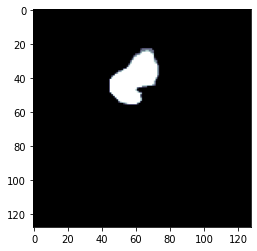

In [14]:
plt.imshow(patients_images_train_labels_resampled[0][10], cmap=plt.cm.bone)

In [ ]:
# create_images_gifs(patients_id[:5], patients_images_train_labels_resampled[:5], path_to_save="train_labels_cubic.gif")
display.Image(f"train_labels_cubic.gif", format="png")

In [62]:
np.save(f'train_data_cubic1.npy', patients_images_resampled)
np.save(f'train_labels_cubic1.npy', patients_images_train_labels_resampled)
patients_images_resampled.dtype

dtype('int16')

##### Вариант 4: "Умный кубик"

In [16]:
# # Умная интерполяция для подгона под размер вокселя [1, 1, 1]
patients_images_train_labels_resampled = []
# patients_images_hu = np.array(patients_images_hu)
for i, images in enumerate(patients_images_train_labels):
    print(f'Shape before resampling:{show_shape(patients_images_train_labels, index=i)}')
    images = np.array(images)
    images_resampled, spacing = resample_path(images, patients[i][0], [1,1,1])
    print(spacing)
    patients_images_train_labels_resampled.append(images_resampled)
    print(f'Shape after resampling:{show_shape(patients_images_train_labels_resampled, index=i)}')
patients_images_train_labels_resampled = np.array(patients_images_train_labels_resampled)

Shape before resampling:(20, 96, 512, 512)
[1.         1.00024873 1.00024873]
Shape after resampling:(1, 288, 352, 352)
Shape before resampling:(20, 81, 512, 512)
[1.0007722 1.        1.       ]
Shape after resampling:(2, 259, 398, 398)
Shape before resampling:(20, 95, 512, 512)
[1. 1. 1.]
Shape after resampling:(3, 304, 387, 387)
Shape before resampling:(20, 88, 512, 512)
[1.         0.99870597 0.99870597]
Shape after resampling:(4, 264, 333, 333)
Shape before resampling:(20, 123, 512, 512)
[0.99898477 1.         1.        ]
Shape after resampling:(5, 394, 376, 376)
Shape before resampling:(20, 110, 512, 512)
[1. 1. 1.]
Shape after resampling:(6, 352, 355, 355)
Shape before resampling:(20, 95, 512, 512)
[1. 1. 1.]
Shape after resampling:(7, 304, 291, 291)
Shape before resampling:(20, 91, 512, 512)
[1.00068729 1.         1.        ]
Shape after resampling:(8, 291, 405, 405)
Shape before resampling:(20, 111, 512, 512)
[1.00056338 1.         1.        ]
Shape after resampling:(9, 355, 35

In [17]:
# Избавляемся от крышки. Теперь по depth пациенты равны абсолютно
cut_min = min([len(patients_images_train_labels_resampled[i]) for i in range(len(patients_images_train_labels_resampled))])
patients_wise_labels = []
for i in range(len(patients_images_train_labels_resampled)):
    a = patients_images_train_labels_resampled[i][:cut_min]
    patients_wise_labels.append(a)
show_shape(patients_wise_labels, index=i)

(20, 246, 375, 375)

In [19]:
# Интерполируем по глубине
patients_images_train_labels_resampled = []
target_scale = 128

# patients_images_hu = np.array(patients_images_hu)
print(f'Shape before resampling:{show_shape(patients_wise_labels)}')

for images in patients_wise_labels:
    images_resampled = resize_data_volume_only_depth(images,  target_scale)
    patients_images_train_labels_resampled.append(images_resampled)
# patients_images_resampled = np.array(patients_images_resampled)
print(f'Shape after resampling:{show_shape(patients_images_train_labels_resampled)}')
# Shape before resampling:(20, 246, 352, 352)
# resize factor is 0.5203252032520326
# Shape after resampling:(20, 128, 352, 352)

Shape before resampling:(20, 246, 352, 352)
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
resize factor is 0.5203252032520326
Shape after resampling:(20, 128, 352, 352)


In [20]:
# Подгоняем размер всех изображений под 128 на 128
print(f'Shape before resizing:{show_shape(patients_images_train_labels_resampled)}')
patients_images_train_labels_resized= []
for images in patients_images_train_labels_resampled:
    images_resized = resize(images, 128)
    patients_images_train_labels_resized.append(images_resized)
patients_images_train_labels_resized = np.array(patients_images_train_labels_resized)
print(f'Shape after resizing:{show_shape(patients_images_train_labels_resized)}')
# Shape before resizing:(20, 128, 352, 352)
# Shape after resizing:(20, 128, 128, 128)

Shape before resizing:(20, 128, 352, 352)
Shape after resizing:(20, 128, 128, 128)


In [ ]:
create_images_gifs(patients_id[:5], patients_images_train_labels_resized[:5], path_to_save="train_labels_wise.gif")
display.Image(f"train_labels_wise.gif", format="png")

In [25]:
# Пересохранить
np.save(f'train_data_wise.npy', patients_images_resized)
np.save(f'train_labels_wise.npy', patients_images_train_labels_resized)

#### Начало обучения

##### Вариант 1: Не кубик, подгонка под 0-го пациента

In [3]:
x_train = np.load(f"./train_data.npy").astype(np.uint8)
y_train = np.load(f"./train_labels.npy").astype(np.uint8)

In [4]:
x_train = x_train.reshape((20, 243, 128, 128, 1))
x_train.shape

(20, 243, 128, 128, 1)

In [5]:
array = [0]*len(x_train)
for i, x in enumerate(x_train):
    array[i] = np.delete(x_train[i], [240, 241, 242], axis=0)
np.array(array).shape
x_train = np.array(array.copy())
x_train.shape

(20, 240, 128, 128, 1)

In [6]:
y_train = y_train.reshape((20, 243, 128, 128, 1))
y_train.shape

(20, 243, 128, 128, 1)

In [7]:
array = [0]*len(y_train)
for i, x in enumerate(y_train):
    array[i] = np.delete(y_train[i], [240, 241, 242], axis=0)
np.array(array).shape
y_train = np.array(array.copy())
y_train.shape

(20, 240, 128, 128, 1)

ничего не сохранилось. больше не пробовал.

##### Вариант 2,3 : Нормальное преобразование каждого пациента в кубик 128, 128, 128

In [3]:
# Вариант 2
# x_train = np.load(f"./train_data_cubic1.npy").astype(np.uint16)
# y_train = np.load(f"./train_labels_cubic1.npy").astype(np.uint16)
# Вариант 3
x_train = np.load(f"./train_data_cubic1.npy").astype(np.uint16)
y_train = np.load(f"./train_labels_cubic1.npy").astype(np.uint16)

In [4]:
x_train = x_train.reshape((20, 128, 128, 128, 1))
x_train.shape

(20, 128, 128, 128, 1)

In [5]:
x_train = x_train.astype(np.float32)
y_train = y_train.astype(np.float32)
x_train.dtype

dtype('float32')

Это чтобы не перезапускать ядро из-за изменения импортированного файла

In [43]:
from tensorflow.keras.optimizers import SGD

def _Unet3D(pretrained_weights = None, patients = 30, slices = 64, width = 128, height = 128, channels = 1): # len(patient_images_resampled) = 3
    input_size = (slices, width, height, channels)
    inputs = Input(input_size)
    conv1 = Conv3D(16, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(inputs)
    conv1 = Conv3D(16, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv1)
    pool1 = MaxPooling3D(pool_size=(2, 2, 2))(conv1)
    conv2 = Conv3D(32, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool1)
    conv2 = Conv3D(32, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv2)
    pool2 = MaxPooling3D(pool_size=(2, 2, 2))(conv2)
    conv3 = Conv3D(64, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool2)
    conv3 = Conv3D(64, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv3)
    pool3 = MaxPooling3D(pool_size=(2, 2, 2))(conv3)
    conv4 = Conv3D(128, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool3)
    conv4 = Conv3D(128, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv4)
    drop4 = Dropout(0.5)(conv4)
    pool4 = MaxPooling3D(pool_size=(2, 2, 2))(drop4)

    conv5 = Conv3D(256, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool4)
    conv5 = Conv3D(256, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv5)
    drop5 = Dropout(0.5)(conv5)

    up6 = Conv3D(128, kernel_size=(2, 2, 2), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling3D(size = (2, 2, 2))(drop5))
    merge6 = concatenate([drop4, up6], axis = 4)
    conv6 = Conv3D(128, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge6)
    conv6 = Conv3D(128, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv6)

    up7 = Conv3D(64, kernel_size=(2, 2, 2), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling3D(size = (2, 2, 2))(conv6))
    merge7 = concatenate([conv3, up7], axis = 4)
    conv7 = Conv3D(64, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge7)
    conv7 = Conv3D(64, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv7)

    up8 = Conv3D(32, kernel_size=(2, 2, 2), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling3D(size = (2, 2, 2))(conv7))
    merge8 = concatenate([conv2, up8], axis = 4)
    conv8 = Conv3D(32, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge8)
    conv8 = Conv3D(32, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv8)

    up9 = Conv3D(16, kernel_size=(2, 2, 2), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling3D(size = (2, 2, 2))(conv8))
    merge9 = concatenate([conv1, up9], axis = 4)
    conv9 = Conv3D(16, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge9)
    conv9 = Conv3D(16, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
    conv9 = Conv3D(2, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
    conv10 = Conv3D(1, kernel_size=(1, 1, 1), activation = 'sigmoid')(conv9)

    model = Model(inputs, conv10)
    # model.compile(optimizer = SGD(lr = 1e-8), loss = "binary_crossentropy", metrics = ["accuracy"])
    model.compile(optimizer = Adam(lr = 1e-5), loss = "binary_crossentropy", metrics = ["accuracy"])

    if(pretrained_weights):
        model.load_weights(pretrained_weights)

    return model

In [19]:
from tensorflow.keras.optimizers import SGD

def _Unet3D(pretrained_weights = None, patients = 30, slices = 64, width = 128, height = 128, channels = 1): # len(patient_images_resampled) = 3
    input_size = (slices, width, height, channels)
    inputs = Input(input_size)
    conv1 = Conv3D(32, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(inputs)
    conv1 = Conv3D(32, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv1)
    pool1 = MaxPooling3D(pool_size=(2, 2, 2))(conv1)
    conv2 = Conv3D(64, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool1)
    conv2 = Conv3D(64, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv2)
    pool2 = MaxPooling3D(pool_size=(2, 2, 2))(conv2)
    conv3 = Conv3D(128, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool2)
    conv3 = Conv3D(128, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv3)
    pool3 = MaxPooling3D(pool_size=(2, 2, 2))(conv3)
    conv4 = Conv3D(256, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool3)
    conv4 = Conv3D(256, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv4)
    drop4 = Dropout(0.5)(conv4)
    pool4 = MaxPooling3D(pool_size=(2, 2, 2))(drop4)

    conv5 = Conv3D(512, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool4)
    conv5 = Conv3D(512, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv5)
    drop5 = Dropout(0.5)(conv5)

    up6 = Conv3D(256, kernel_size=(2, 2, 2), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling3D(size = (2, 2, 2))(drop5))
    merge6 = concatenate([drop4, up6], axis = 4)
    conv6 = Conv3D(256, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge6)
    conv6 = Conv3D(256, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv6)

    up7 = Conv3D(128, kernel_size=(2, 2, 2), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling3D(size = (2, 2, 2))(conv6))
    merge7 = concatenate([conv3, up7], axis = 4)
    conv7 = Conv3D(128, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge7)
    conv7 = Conv3D(128, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv7)

    up8 = Conv3D(64, kernel_size=(2, 2, 2), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling3D(size = (2, 2, 2))(conv7))
    merge8 = concatenate([conv2, up8], axis = 4)
    conv8 = Conv3D(64, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge8)
    conv8 = Conv3D(64, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv8)

    up9 = Conv3D(32, kernel_size=(2, 2, 2), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling3D(size = (2, 2, 2))(conv8))
    merge9 = concatenate([conv1, up9], axis = 4)
    conv9 = Conv3D(32, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge9)
    conv9 = Conv3D(32, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
    conv9 = Conv3D(2, kernel_size=(3, 3, 3), activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
    conv10 = Conv3D(1, kernel_size=(1, 1, 1), activation = 'sigmoid')(conv9)

    model = Model(inputs, conv10)
    model.compile(optimizer = SGD(lr = 1e-9), loss = "binary_crossentropy", metrics = ["accuracy"])

    if(pretrained_weights):
        model.load_weights(pretrained_weights)

    return model

In [20]:
model = _Unet3D(patients=1, slices=128, width=128, height=128, channels=1)
model.summary()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 128, 128, 12 0                                            
__________________________________________________________________________________________________
conv3d_96 (Conv3D)              (None, 128, 128, 128 896         input_5[0][0]                    
__________________________________________________________________________________________________
conv3d_97 (Conv3D)              (None, 128, 128, 128 27680       conv3d_96[0][0]                  
__________________________________________________________________________________________________
max_pooling3d_16 (MaxPooling3D) (None, 64, 64, 64, 3 0           conv3d_97[0][0]                  
____________________________________________________________________________________________

In [17]:
import tensorflow
tensorflow.test.is_gpu_available()

True

In [23]:
# Это там, где [32, 64 ...] каналов, SGD, Вариант 3
model.fit(x=x_train[:18], y=y_train[:18], batch_size=1, epochs=5, validation_split=0.2)

Train on 14 samples, validate on 4 samples
Epoch 1/5
14/14 [==============================] - 60s 4s/sample - loss: 1074.0716 - acc: 0.8043 - val_loss: 894.6521 - val_acc: 0.8386
Epoch 2/5
14/14 [==============================] - 60s 4s/sample - loss: 937.5908 - acc: 0.7742 - val_loss: 821.6362 - val_acc: 0.8193
Epoch 3/5
14/14 [==============================] - 60s 4s/sample - loss: 804.6443 - acc: 0.7427 - val_loss: 751.7309 - val_acc: 0.7968
Epoch 4/5
14/14 [==============================] - 60s 4s/sample - loss: 683.5188 - acc: 0.7040 - val_loss: 685.2913 - val_acc: 0.7717
Epoch 5/5
14/14 [==============================] - 60s 4s/sample - loss: 585.9656 - acc: 0.6689 - val_loss: 621.9964 - val_acc: 0.7441


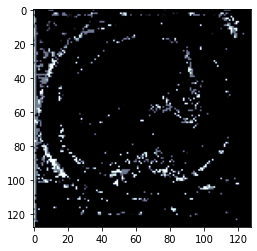

In [22]:
# Это было сделано при 1-ой эпохе обучения
x_test = x_train[:1].copy()
prediction1 = model.predict(x_test)
plt.imshow(prediction1[0][100], cmap=plt.cm.bone)

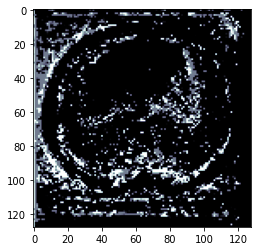

In [26]:
# Это было сделано после 5-ти эпох обучения
x_test = x_train[:1].copy()
prediction1 = model.predict(x_test)
plt.imshow(prediction1[0][100], cmap=plt.cm.bone)

##### Вариант 4

In [26]:
x_train = np.load(f"./train_data_wise.npy").astype(np.uint16)
y_train = np.load(f"./train_labels_wise.npy").astype(np.uint16)

In [27]:
x_train = x_train.reshape((20, 128, 128, 128, 1))
x_train.shape

(20, 128, 128, 128, 1)

In [28]:
x_train = x_train.astype(np.float32)
y_train = y_train.astype(np.float32)
x_train.dtype

dtype('float32')

In [44]:
model = _Unet3D(patients=1, slices=128, width=128, height=128, channels=1)
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 128, 128, 12 0                                            
__________________________________________________________________________________________________
conv3d_48 (Conv3D)              (None, 128, 128, 128 448         input_3[0][0]                    
__________________________________________________________________________________________________
conv3d_49 (Conv3D)              (None, 128, 128, 128 6928        conv3d_48[0][0]                  
__________________________________________________________________________________________________
max_pooling3d_8 (MaxPooling3D)  (None, 64, 64, 64, 1 0           conv3d_49[0][0]                  
____________________________________________________________________________________________

In [45]:
import tensorflow
tensorflow.test.is_gpu_available()

True

In [46]:
# Это [16, 32 ... ] каналов, Adam
history = model.fit(x=x_train[:18], y=y_train[:18], batch_size=1, epochs=5, validation_split=0.2)

Train on 14 samples, validate on 4 samples
Epoch 1/5
14/14 [==============================] - 25s 2s/sample - loss: 3149.0521 - acc: 0.8917 - val_loss: 2524.4596 - val_acc: 0.8806
Epoch 2/5
14/14 [==============================] - 24s 2s/sample - loss: 1991.6492 - acc: 0.8633 - val_loss: 1622.8783 - val_acc: 0.8425
Epoch 3/5
14/14 [==============================] - 24s 2s/sample - loss: 1152.9544 - acc: 0.8143 - val_loss: 856.4146 - val_acc: 0.7492
Epoch 4/5
14/14 [==============================] - 24s 2s/sample - loss: 621.2911 - acc: 0.7054 - val_loss: 497.1927 - val_acc: 0.6186
Epoch 5/5
14/14 [==============================] - 24s 2s/sample - loss: 299.0843 - acc: 0.5361 - val_loss: 222.7473 - val_acc: 0.4363


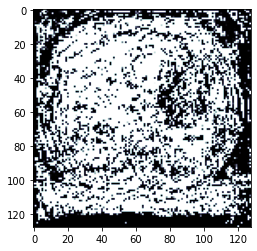

In [47]:
# Это Adam, 5 эпох
x_test = x_train[:1].copy()
prediction1 = model.predict(x_test)
plt.imshow(prediction1[0][100], cmap=plt.cm.bone)

In [41]:
# Это [16, 32 ... ] каналов, SGD
history = model.fit(x=x_train[:18], y=y_train[:18], batch_size=1, epochs=5, validation_split=0.2)

Train on 14 samples, validate on 4 samples
Epoch 1/5
14/14 [==============================] - 24s 2s/sample - loss: 722.6408 - acc: 0.5348 - val_loss: 408.2073 - val_acc: 0.4626
Epoch 2/5
14/14 [==============================] - 24s 2s/sample - loss: 307.4702 - acc: 0.3388 - val_loss: 260.9218 - val_acc: 0.3543
Epoch 3/5
14/14 [==============================] - 24s 2s/sample - loss: 150.9410 - acc: 0.2318 - val_loss: 188.3006 - val_acc: 0.2878
Epoch 4/5
14/14 [==============================] - 24s 2s/sample - loss: 87.0514 - acc: 0.1722 - val_loss: 145.6377 - val_acc: 0.2440
Epoch 5/5
14/14 [==============================] - 24s 2s/sample - loss: 58.8046 - acc: 0.1383 - val_loss: 117.7553 - val_acc: 0.2135


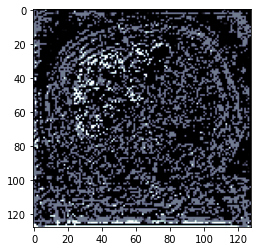

In [40]:
# Это SGD при 1 эпохе
x_test = x_train[:1].copy()
prediction1 = model.predict(x_test)
plt.imshow(prediction1[0][100], cmap=plt.cm.bone)

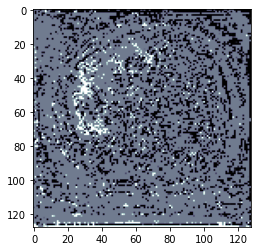

In [42]:
# Это SGD после 5 эпох
x_test = x_train[:1].copy()
prediction1 = model.predict(x_test)
plt.imshow(prediction1[0][100], cmap=plt.cm.bone)

##### Мусор после большого числа попыток

In [80]:
def create_images_gifs1(patients_id, patients_images, path_to_save="output.gif"):
    final_gif = imageio.get_writer(path_to_save)
    temp_gifs = []
    for i in range(len(patients_id)):
        imageio.mimsave(f"./{patients_id[i]}.gif", patients_images[i], duration=0.1)
        temp_gifs.append(imageio.get_reader(f"./{patients_id[i]}.gif"))
    number_of_frames = min([value.get_length() for value in temp_gifs])
    for _ in range(number_of_frames):
        next_img = [temp_gifs[i].get_next_data() for i in range(len(patients_id))]
        new_image = np.hstack(next_img) # vstack делает по вертикали
        final_gif.append_data(new_image)
    final_gif.close()

In [81]:
patients_id = [1, 2, 5, 6, 8, 10, 14, 16, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]
prediction = prediction.astype(np.float32)
create_images_gifs1(patients_id[:1], prediction)

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0

In [83]:
model.save_weights("Adam_cubic.h5")

In [96]:
model.fit(x=x_train, y=y_train, batch_size=1, epochs=10, validation_split=0.2)

Train on 16 samples, validate on 4 samples
Epoch 1/10
16/16 [==============================] - 68s 4s/sample - loss: 16.3024 - acc: 0.0467 - val_loss: 8.0644 - val_acc: 0.0436
Epoch 2/10
16/16 [==============================] - 68s 4s/sample - loss: 5.3725 - acc: 0.0336 - val_loss: 5.3971 - val_acc: 0.0363
Epoch 3/10
16/16 [==============================] - 68s 4s/sample - loss: 3.2028 - acc: 0.0296 - val_loss: 4.6300 - val_acc: 0.0343
Epoch 4/10
16/16 [==============================] - 68s 4s/sample - loss: 2.7449 - acc: 0.0284 - val_loss: 4.2607 - val_acc: 0.0335
Epoch 5/10
16/16 [==============================] - 68s 4s/sample - loss: 2.5539 - acc: 0.0279 - val_loss: 4.0031 - val_acc: 0.0331
Epoch 6/10
16/16 [==============================] - 68s 4s/sample - loss: 2.3739 - acc: 0.0276 - val_loss: 3.7543 - val_acc: 0.0327
Epoch 7/10
16/16 [==============================] - 68s 4s/sample - loss: 2.1984 - acc: 0.0272 - val_loss: 3.5311 - val_acc: 0.0324
Epoch 8/10
16/16 [==============

In [101]:
prediction1 = model.predict(x_test)

In [102]:
create_images_gifs1(patients_id[:1], prediction1)

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0

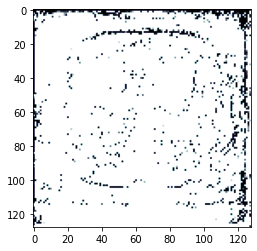

In [103]:
plt.imshow(prediction1[0][127], cmap=plt.cm.bone)

In [105]:
model = _Unet3D(patients=1, slices=128, width=128, height=128, channels=1)

In [107]:
history = model.fit(x=x_train, y=y_train, batch_size=1, epochs=1, validation_split=0.2)

Train on 16 samples, validate on 4 samples
16/16 [==============================] - 67s 4s/sample - loss: nan - acc: 0.9107 - val_loss: nan - val_acc: 0.9491


In [108]:
prediction2 = model.predict(x_test)

C:\Users\Olyni\AppData\Local\Programs\Python\Python36\lib\site-packages\matplotlib\image.py:446: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
C:\Users\Olyni\AppData\Local\Programs\Python\Python36\lib\site-packages\matplotlib\image.py:453: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
C:\Users\Olyni\AppData\Local\Programs\Python\Python36\lib\site-packages\matplotlib\image.py:458: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)


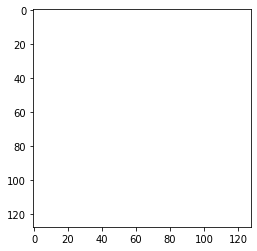

In [109]:
plt.imshow(prediction2[0][127], cmap=plt.cm.bone)

In [111]:
model = _Unet3D(patients=1, slices=128, width=128, height=128, channels=1)

In [130]:
model.fit(x=x_train[:3], y=y_train[:3], batch_size=1, epochs=1, validation_split=0.2)

Train on 2 samples, validate on 1 samples


ResourceExhaustedError: OOM when allocating tensor with shape[1,128,128,128,128] and type float on /job:localhost/replica:0/task:0/device:DML:0 by allocator DmlAllocator
	 [[{{node training_6/Adam/gradients/gradients/loss_5/conv3d_143_loss/logistic_loss/sub_grad/Neg}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.


In [127]:
prediction3 = model.predict(x_test)

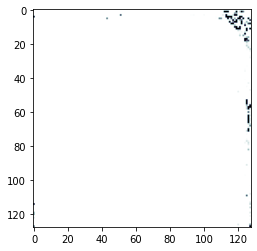

In [128]:
plt.imshow(prediction3[0][127], cmap=plt.cm.bone)

In [181]:
# from tensorflow.keras.backend import clear_session
# clear_session()
# import gc
# gc.collect()

In [86]:
x_test = x_train[:2]
x_test.shape

(2, 128, 128, 128, 1)

In [91]:
prediction = model.predict(x_test)

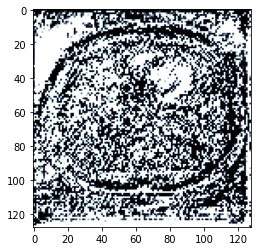

In [79]:
plt.imshow(prediction[0][127], cmap=plt.cm.bone)